In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import joblib
from sklearn import tree
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.ensemble import IsolationForest

In [2]:
#load all data into dataframes and clean

In [3]:
monday = pd.read_csv("MachineLearningCVE/Monday-WorkingHours_pcap_ISCX.csv")

In [4]:
monday

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,49188,4,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,49188,1,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,49188,1,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,49188,1,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,49486,3,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
529913,443,18738,1,1,6,6,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
529914,53,60797,2,2,80,156,40,40,40.0,0.0,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
529915,53,154,2,2,64,96,32,32,32.0,0.0,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
529916,53,155,2,2,80,144,40,40,40.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [5]:
monday.dropna(inplace = True)
new_monday = monday.replace([np.inf, -np.inf], 0)

In [6]:
new_monday

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,49188,4,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,49188,1,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,49188,1,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,49188,1,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,49486,3,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
529913,443,18738,1,1,6,6,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
529914,53,60797,2,2,80,156,40,40,40.0,0.0,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
529915,53,154,2,2,64,96,32,32,32.0,0.0,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
529916,53,155,2,2,80,144,40,40,40.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [7]:
#new_monday = new_monday.select_dtypes(include='number').astype(int)

In [8]:
tuesday = pd.read_csv("MachineLearningCVE/Tuesday-WorkingHours_pcap_ISCX.csv")

In [9]:
tuesday.dropna(inplace = True)
new_tuesday = tuesday.replace([np.inf, -np.inf], 0)
#new_tuesday = new_tuesday.select_dtypes(include='number').astype(int)

In [10]:
new_tuesday

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,88,640,7,4,440,358,220,0,62.857143,107.349008,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,88,900,9,4,600,2944,300,0,66.666667,132.287566,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,88,1205,7,4,2776,2830,1388,0,396.571429,677.274651,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,88,511,7,4,452,370,226,0,64.571429,110.276708,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,88,773,9,4,612,2944,306,0,68.000000,134.933317,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445904,53,155,2,2,88,120,44,44,44.000000,0.000000,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
445905,59317,110,1,1,0,0,0,0,0.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
445906,53,166,2,2,88,188,44,44,44.000000,0.000000,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
445907,54726,81,1,1,0,0,0,0,0.000000,0.000000,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [11]:
wednesday = pd.read_csv("MachineLearningCVE/Wednesday-workingHours_pcap_ISCX.csv")

In [12]:
wednesday

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,80,38308,1,1,6,6,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,389,479,11,5,172,326,79,0,15.636364,31.449238,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,88,1095,10,6,3150,3150,1575,0,315.000000,632.561635,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,389,15206,17,12,3452,6660,1313,0,203.058823,425.778474,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,88,1092,9,6,3150,3152,1575,0,350.000000,694.509719,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
692698,53,32215,4,2,112,152,28,28,28.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
692699,53,324,2,2,84,362,42,42,42.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
692700,58030,82,2,1,31,6,31,0,15.500000,21.920310,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
692701,53,1048635,6,2,192,256,32,32,32.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [13]:
wednesday.dropna(inplace = True)
new_wednesday = wednesday.replace([np.inf, -np.inf], 0)
#new_wednesday = new_wednesday.select_dtypes(include='number').astype(int)

In [14]:
new_wednesday

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,80,38308,1,1,6,6,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,389,479,11,5,172,326,79,0,15.636364,31.449238,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,88,1095,10,6,3150,3150,1575,0,315.000000,632.561635,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,389,15206,17,12,3452,6660,1313,0,203.058823,425.778474,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,88,1092,9,6,3150,3152,1575,0,350.000000,694.509719,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
692698,53,32215,4,2,112,152,28,28,28.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
692699,53,324,2,2,84,362,42,42,42.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
692700,58030,82,2,1,31,6,31,0,15.500000,21.920310,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
692701,53,1048635,6,2,192,256,32,32,32.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [15]:
thursday_morning = pd.read_csv("MachineLearningCVE/Thursday-WorkingHours-Morning-WebAttacks_pcap_ISCX.csv")

In [16]:
thursday_morning.dropna(inplace = True)
new_thursday_morning = thursday_morning.replace([np.inf, -np.inf], 0)
#new_thursday_morning = new_thursday_morning.select_dtypes(include='number').astype(int)

In [17]:
thursday_morning

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,389,113095465,48,24,9668,10012,403,0,201.416667,203.548293,...,32,203985.500,5.758373e+05,1629110,379,13800000.0,4.277541e+06,16500000,6737603,BENIGN
1,389,113473706,68,40,11364,12718,403,0,167.117647,171.919413,...,32,178326.875,5.034269e+05,1424245,325,13800000.0,4.229413e+06,16500000,6945512,BENIGN
2,0,119945515,150,0,0,0,0,0,0.000000,0.000000,...,0,6909777.333,1.170000e+07,20400000,6,24400000.0,2.430000e+07,60100000,5702188,BENIGN
3,443,60261928,9,7,2330,4221,1093,0,258.888889,409.702161,...,20,0.000,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
4,53,269,2,2,102,322,51,51,51.000000,0.000000,...,32,0.000,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170361,55641,49,1,3,6,18,6,6,6.000000,0.000000,...,20,0.000,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
170362,45337,217,2,1,31,6,31,0,15.500000,21.920310,...,32,0.000,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
170363,22,1387547,41,46,2728,6634,456,0,66.536585,110.129945,...,32,0.000,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
170364,22,207,1,1,0,0,0,0,0.000000,0.000000,...,32,0.000,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN


In [18]:
thursday_afternoon = pd.read_csv("MachineLearningCVE/Thursday-WorkingHours-Afternoon-Infilteration_pcap_ISCX.csv")

In [19]:
thursday_afternoon.dropna(inplace = True)
new_thursday_afternoon = thursday_afternoon.replace([np.inf, -np.inf], 0)
#new_thursday_afternoon = new_thursday_afternoon.select_dtypes(include='number').astype(int)

In [20]:
friday_morning = pd.read_csv("MachineLearningCVE/Friday-WorkingHours-Morning_pcap_ISCX.csv")

In [21]:
friday_morning

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,3268,112740690,32,16,6448,1152,403,0,201.5,204.724205,...,32,3.594286e+02,1.199802e+01,380,343,16100000.0,4.988048e+05,16400000,15400000,BENIGN
1,389,112740560,32,16,6448,5056,403,0,201.5,204.724205,...,32,3.202857e+02,1.574499e+01,330,285,16100000.0,4.987937e+05,16400000,15400000,BENIGN
2,0,113757377,545,0,0,0,0,0,0.0,0.000000,...,0,9.361829e+06,7.324646e+06,18900000,19,12200000.0,6.935824e+06,20800000,5504997,BENIGN
3,5355,100126,22,0,616,0,28,28,28.0,0.000000,...,32,0.000000e+00,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
4,0,54760,4,0,0,0,0,0,0.0,0.000000,...,0,0.000000e+00,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191028,53,61452,4,2,180,354,45,45,45.0,0.000000,...,20,0.000000e+00,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
191029,53,171,2,2,80,272,40,40,40.0,0.000000,...,32,0.000000e+00,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
191030,53,222,2,2,90,354,45,45,45.0,0.000000,...,32,0.000000e+00,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
191031,123,16842,1,1,48,48,48,48,48.0,0.000000,...,20,0.000000e+00,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN


In [22]:
friday_morning.dropna(inplace = True)
new_friday_morning = friday_morning.replace([np.inf, -np.inf], 0)
#new_friday_morning = new_friday_morning.select_dtypes(include='number').astype(int)

In [23]:
friday_afternoon1 = pd.read_csv("MachineLearningCVE/Friday-WorkingHours-Afternoon-DDos_pcap_ISCX.csv")

In [24]:
friday_afternoon1.dropna(inplace = True)
new_friday_afternoon1 = friday_afternoon1.replace([np.inf, -np.inf], 0)
#new_friday_afternoon1 = new_friday_afternoon1.select_dtypes(include='number').astype(int)

In [25]:
friday_afternoon2 = pd.read_csv("MachineLearningCVE/Friday-WorkingHours-Afternoon-PortScan_pcap_ISCX.csv")

In [26]:
friday_afternoon2.dropna(inplace = True)
new_friday_afternoon2 = friday_afternoon2.replace([np.inf, -np.inf], 0)
#new_friday_afternoon2 = new_friday_afternoon2.select_dtypes(include='number').astype(int)

In [27]:
#merge all into one dataframe

In [28]:
attacks_df = new_monday.append([new_tuesday, new_wednesday, new_thursday_morning, new_thursday_afternoon, new_friday_morning, new_friday_afternoon1, new_friday_afternoon2])

In [29]:
attacks_df

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,49188,4,2,0,12,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,49188,1,2,0,12,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,49188,1,2,0,12,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,49188,1,2,0,12,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,49486,3,2,0,12,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
286462,443,196135,49,57,1331,105841,570,0,27.163265,108.067176,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
286463,443,378424,49,59,1325,104393,570,0,27.040816,108.095051,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
286464,443,161800,70,103,1427,215903,570,0,20.385714,90.746389,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
286465,443,142864,50,62,1331,110185,570,0,26.620000,107.027727,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [30]:
attacks_df.head()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,49188,4,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,49188,1,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,49188,1,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,49188,1,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,49486,3,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [31]:
attacks_df.shape

(2829385, 79)

In [32]:
attacks_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2829385 entries, 0 to 286466
Data columns (total 79 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0    Destination Port             int64  
 1    Flow Duration                int64  
 2    Total Fwd Packets            int64  
 3    Total Backward Packets       int64  
 4   Total Length of Fwd Packets   int64  
 5    Total Length of Bwd Packets  int64  
 6    Fwd Packet Length Max        int64  
 7    Fwd Packet Length Min        int64  
 8    Fwd Packet Length Mean       float64
 9    Fwd Packet Length Std        float64
 10  Bwd Packet Length Max         int64  
 11   Bwd Packet Length Min        int64  
 12   Bwd Packet Length Mean       float64
 13   Bwd Packet Length Std        float64
 14  Flow Bytes/s                  float64
 15   Flow Packets/s               float64
 16   Flow IAT Mean                float64
 17   Flow IAT Std                 float64
 18   Flow IAT Max          

In [34]:
attacks_df.columns = attacks_df.columns.str.replace(' ', '')
attacks_df['Label'] = attacks_df['Label'].str.replace(' � ', ' ')

In [35]:
attacks_df['Label'].value_counts()

BENIGN                      2272688
DoS Hulk                     230124
PortScan                     158930
DDoS                         128027
DoS GoldenEye                 10293
FTP-Patator                    7938
SSH-Patator                    5897
DoS slowloris                  5796
DoS Slowhttptest               5499
Bot                            1966
Web Attack Brute Force         1507
Web Attack XSS                  652
Infiltration                     36
Web Attack Sql Injection         21
Heartbleed                       11
Name: Label, dtype: int64

In [36]:
class_names = attacks_df['Label'].unique()
class_names

array(['BENIGN', 'FTP-Patator', 'SSH-Patator', 'DoS slowloris',
       'DoS Slowhttptest', 'DoS Hulk', 'DoS GoldenEye', 'Heartbleed',
       'Web Attack Brute Force', 'Web Attack XSS',
       'Web Attack Sql Injection', 'Infiltration', 'Bot', 'DDoS',
       'PortScan'], dtype=object)

In [39]:
#Isolate labels from features and use unsupervised leaning (KMeans clustering elbow method) to determine the number of clusters present in dataset (Labels)

In [40]:
X = attacks_df.drop(columns = ['Label'])
y = attacks_df['Label']

In [41]:
#check for ideal clusters

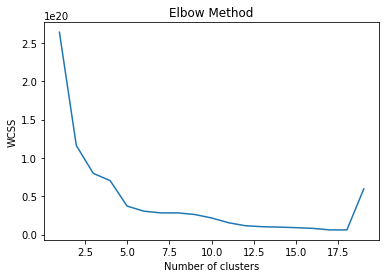

In [42]:
wcss = []
for i in range(1, 20):
    kmeans = MiniBatchKMeans(n_clusters=i, random_state=0, batch_size=250000)
    kmeans = kmeans.partial_fit(X.iloc[0:250000,:])
    kmeans = kmeans.partial_fit(X.iloc[250000:500000,:])
    kmeans = kmeans.partial_fit(X.iloc[500000:750000,:])
    kmeans = kmeans.partial_fit(X.iloc[750000:1000000,:])
    kmeans = kmeans.partial_fit(X.iloc[1000000:1250000,:])
    kmeans = kmeans.partial_fit(X.iloc[1250000:1500000,:])
    kmeans = kmeans.partial_fit(X.iloc[1500000:1750000,:])
    kmeans = kmeans.partial_fit(X.iloc[1750000:2000000,:])
    kmeans = kmeans.partial_fit(X.iloc[2000000:2250000,:])
    kmeans = kmeans.partial_fit(X.iloc[2250000:2500000,:])
    kmeans = kmeans.partial_fit(X.iloc[2500000:2750000,:])
    kmeans = kmeans.partial_fit(X.iloc[2750000:2829385,:])
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 20), wcss)
plt.title("Elbow Method")
plt.xlabel("Number of clusters")
plt.ylabel("WCSS")

plt.plot(figsize=(100,80))
plt.rcParams['figure.figsize'] = [12, 8]
plt.savefig('elbow_method.png')
plt.show()

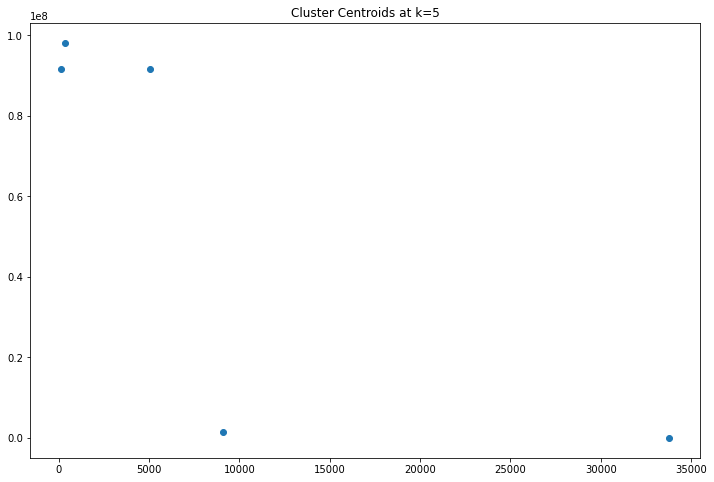

In [43]:
#Elbow shows sharp drop in variance at 5 clusters, test and plot
kmeans = MiniBatchKMeans(n_clusters=5, random_state=0, batch_size=250000, max_iter=10).fit(X)
kmeans.cluster_centers_

plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1])

plt.title("Cluster Centroids at k=5")
plt.plot(figsize=(100,80))
plt.rcParams['figure.figsize'] = [12, 8]
plt.savefig('elbow_method_5.png')
plt.show()

In [44]:
#create and train model

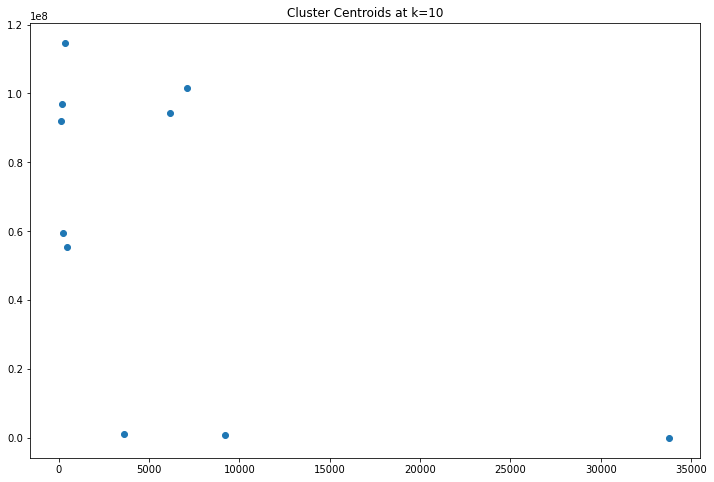

In [45]:
#At 10 clusters, test and plot
kmeans = MiniBatchKMeans(n_clusters=10, random_state=0, batch_size=250000, max_iter=10).fit(X)
kmeans.cluster_centers_

plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1])

plt.title("Cluster Centroids at k=10")
plt.plot(figsize=(100,80))
plt.rcParams['figure.figsize'] = [12, 8]
plt.savefig('elbow_method_10.png')
plt.show()

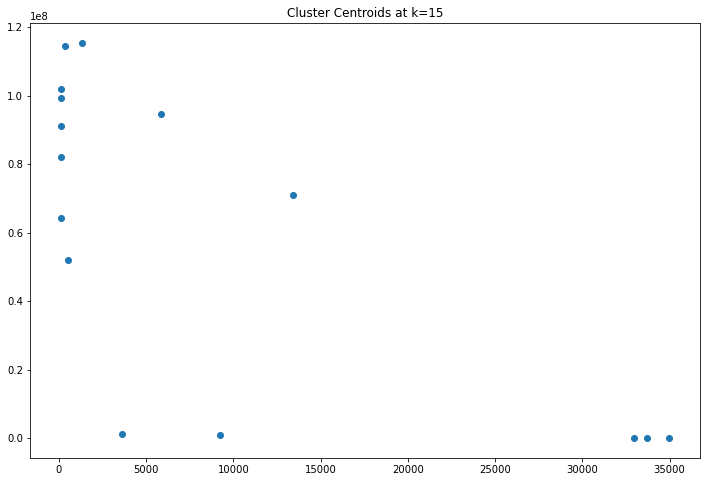

In [46]:
#At 15 clusters, test and plot
kmeans = MiniBatchKMeans(n_clusters=15, random_state=0, batch_size=250000, max_iter=10).fit(X)
kmeans.cluster_centers_

plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1])

plt.title("Cluster Centroids at k=15")
plt.plot(figsize=(100,80))
plt.rcParams['figure.figsize'] = [12, 8]
plt.savefig('elbow_method_15.png')
plt.show()

In [47]:
#Decision tree classification

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

model = DecisionTreeClassifier()
model.fit(X_train, y_train)
predictions = model.predict(X_test)

In [52]:
#check for accuracy

In [53]:
score = accuracy_score(y_test, predictions)
print("Accuracy: ", score)

Accuracy:  0.9983742049950785


In [54]:
target_names = ['BENIGN', 'FTP-Patator', 'SSH-Patator', 'DoS slowloris',
       'DoS Slowhttptest', 'DoS Hulk', 'DoS GoldenEye', 'Heartbleed',
       'Web Attack Brute Force', 'Web Attack XSS',
       'Web Attack Sql Injection', 'Infiltration', 'Bot', 'DDoS',
       'PortScan'] # target values

y_predict = model.fit(X_train, y_train).predict(X_test)

print(classification_report(y_test, y_predict, target_names=target_names))

#print(confusion_matrix(y_test, y_predict))

                          precision    recall  f1-score   support

                  BENIGN       1.00      1.00      1.00    454525
             FTP-Patator       0.83      0.83      0.83       424
             SSH-Patator       1.00      1.00      1.00     25802
           DoS slowloris       1.00      1.00      1.00      2058
        DoS Slowhttptest       1.00      1.00      1.00     45799
                DoS Hulk       0.99      0.99      0.99      1148
           DoS GoldenEye       1.00      1.00      1.00      1146
              Heartbleed       1.00      1.00      1.00      1603
  Web Attack Brute Force       1.00      0.67      0.80         3
          Web Attack XSS       0.67      0.67      0.67         6
Web Attack Sql Injection       0.99      0.99      0.99     31741
            Infiltration       1.00      1.00      1.00      1200
                     Bot       0.74      0.72      0.73       289
                    DDoS       0.60      0.43      0.50         7
         

In [56]:
class_report = classification_report(y_test, y_predict, target_names=target_names, output_dict = True)
print(class_report)

{'BENIGN': {'precision': 0.9992343217476826, 'recall': 0.9991771629723337, 'f1-score': 0.9992057415425776, 'support': 454525}, 'FTP-Patator': {'precision': 0.831353919239905, 'recall': 0.8254716981132075, 'f1-score': 0.8284023668639052, 'support': 424}, 'SSH-Patator': {'precision': 0.9996124481649421, 'recall': 0.9996511898302457, 'f1-score': 0.9996318186222265, 'support': 25802}, 'DoS slowloris': {'precision': 0.9956246961594555, 'recall': 0.9951409135082604, 'f1-score': 0.9953827460510327, 'support': 2058}, 'DoS Slowhttptest': {'precision': 0.9985163528462025, 'recall': 0.9992576257123518, 'f1-score': 0.9988868517548455, 'support': 45799}, 'DoS Hulk': {'precision': 0.9852813852813853, 'recall': 0.9912891986062717, 'f1-score': 0.9882761615284412, 'support': 1148}, 'DoS GoldenEye': {'precision': 0.9956369982547993, 'recall': 0.9956369982547993, 'f1-score': 0.9956369982547993, 'support': 1146}, 'Heartbleed': {'precision': 0.9987523393636931, 'recall': 0.9987523393636931, 'f1-score': 0.9

In [82]:
classification_df = pd.DataFrame(class_report).transpose()
classification_df

,precision,recall,f1-score,support
BENIGN,0.999234,0.999177,0.999206,454525.000000
FTP-Patator,0.831354,0.825472,0.828402,424.000000
SSH-Patator,0.999612,0.999651,0.999632,25802.000000
DoS slowloris,0.995625,0.995141,0.995383,2058.000000
DoS Slowhttptest,0.998516,0.999258,0.998887,45799.000000
DoS Hulk,0.985281,0.991289,0.988276,1148.000000
DoS GoldenEye,0.995637,0.995637,0.995637,1146.000000
Heartbleed,0.998752,0.998752,0.998752,1603.000000
Web Attack Brute Force,1.000000,0.666667,0.800000,3.000000
Web Attack XSS,0.666667,0.666667,0.666667,6.000000


In [85]:
classification_df.to_csv(r'report.csv')

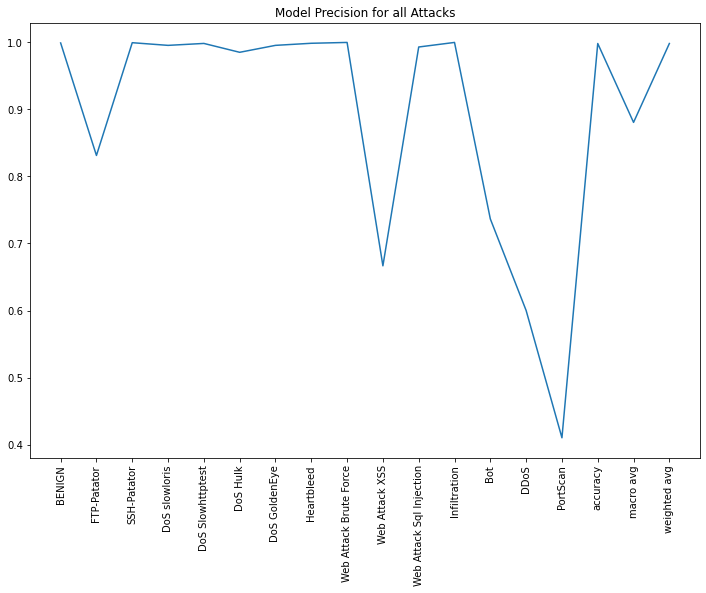

In [77]:
import matplotlib.pyplot as plot

precision = classification_df['precision']
plot.plot(precision)
plot.plot(figsize=(100,80))

plot.rcParams['figure.figsize'] = [12, 8]
#plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
plot.xticks(rotation=90)

plot.title("Model Precision for all Attacks")
plot.savefig('model_precision.png')
plot.show()

In [59]:
#Persisiting the model

In [60]:
joblib.dump(model, "attack_detection.joblib")

['attack_detection.joblib']

In [61]:
#make a decision tree mapping

In [62]:
list(attacks_df.iloc[:, :78])

['DestinationPort',
 'FlowDuration',
 'TotalFwdPackets',
 'TotalBackwardPackets',
 'TotalLengthofFwdPackets',
 'TotalLengthofBwdPackets',
 'FwdPacketLengthMax',
 'FwdPacketLengthMin',
 'FwdPacketLengthMean',
 'FwdPacketLengthStd',
 'BwdPacketLengthMax',
 'BwdPacketLengthMin',
 'BwdPacketLengthMean',
 'BwdPacketLengthStd',
 'FlowBytes/s',
 'FlowPackets/s',
 'FlowIATMean',
 'FlowIATStd',
 'FlowIATMax',
 'FlowIATMin',
 'FwdIATTotal',
 'FwdIATMean',
 'FwdIATStd',
 'FwdIATMax',
 'FwdIATMin',
 'BwdIATTotal',
 'BwdIATMean',
 'BwdIATStd',
 'BwdIATMax',
 'BwdIATMin',
 'FwdPSHFlags',
 'BwdPSHFlags',
 'FwdURGFlags',
 'BwdURGFlags',
 'FwdHeaderLength',
 'BwdHeaderLength',
 'FwdPackets/s',
 'BwdPackets/s',
 'MinPacketLength',
 'MaxPacketLength',
 'PacketLengthMean',
 'PacketLengthStd',
 'PacketLengthVariance',
 'FINFlagCount',
 'SYNFlagCount',
 'RSTFlagCount',
 'PSHFlagCount',
 'ACKFlagCount',
 'URGFlagCount',
 'CWEFlagCount',
 'ECEFlagCount',
 'Down/UpRatio',
 'AveragePacketSize',
 'AvgFwdSegmentS

In [63]:
tree.export_graphviz(model, out_file = "attack_detector.dot", feature_names = list(attacks_df.iloc[:, :78]), 
class_names=sorted(y.unique()), label = "all", rounded = "True", filled = "True")

In [64]:
#Testing for DDOS_attacks

In [65]:
ddos_df = attacks_df.loc[attacks_df['Label'] == 'DDoS']

In [66]:
ddos_df

,DestinationPort,FlowDuration,TotalFwdPackets,TotalBackwardPackets,TotalLengthofFwdPackets,TotalLengthofBwdPackets,FwdPacketLengthMax,FwdPacketLengthMin,FwdPacketLengthMean,FwdPacketLengthStd,...,min_seg_size_forward,ActiveMean,ActiveStd,ActiveMax,ActiveMin,IdleMean,IdleStd,IdleMax,IdleMin,Label
18883,80,1293792,3,7,26,11607,20,0,8.666667,10.263203,...,20,0.0,0.0,0,0,0.0,0.0,0,0,DDoS
18884,80,4421382,4,0,24,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,DDoS
18885,80,1083538,3,6,26,11601,20,0,8.666667,10.263203,...,20,0.0,0.0,0,0,0.0,0.0,0,0,DDoS
18886,80,80034360,8,4,56,11601,20,0,7.000000,5.656854,...,20,939.0,0.0,939,939,39300000.0,44200000.0,70600000,8072664,DDoS
18887,80,642654,3,6,26,11607,20,0,8.666667,10.263203,...,20,0.0,0.0,0,0,0.0,0.0,0,0,DDoS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197538,80,163071,4,0,24,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,DDoS
197539,80,2036,3,6,26,11607,20,0,8.666667,10.263203,...,20,0.0,0.0,0,0,0.0,0.0,0,0,DDoS
197540,80,159465,4,0,24,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,DDoS
197541,80,1453,3,6,26,11607,20,0,8.666667,10.263203,...,20,0.0,0.0,0,0,0.0,0.0,0,0,DDoS


ddos_data_feed = ddos_df.drop(columns = ['Label'])
new_ddos_output = model.predict(ddos_data_feed)
for each_data in new_ddos_output:
    if (each_data != "BENIGN"):
        print ("Suspected " + each_data + " attack detected!")

In [68]:
#mapping predictions with new input through model, alerting with attack type with Wednesday as input

In [69]:
new_wednesday

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,80,38308,1,1,6,6,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,389,479,11,5,172,326,79,0,15.636364,31.449238,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,88,1095,10,6,3150,3150,1575,0,315.000000,632.561635,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,389,15206,17,12,3452,6660,1313,0,203.058823,425.778474,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,88,1092,9,6,3150,3152,1575,0,350.000000,694.509719,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
692698,53,32215,4,2,112,152,28,28,28.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
692699,53,324,2,2,84,362,42,42,42.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
692700,58030,82,2,1,31,6,31,0,15.500000,21.920310,...,32,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
692701,53,1048635,6,2,192,256,32,32,32.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [70]:
new_wednesday.columns = new_wednesday.columns.str.replace(' ', '')

In [71]:
data_feed = new_wednesday.drop(columns = ['Label'])

In [72]:
data_feed

,DestinationPort,FlowDuration,TotalFwdPackets,TotalBackwardPackets,TotalLengthofFwdPackets,TotalLengthofBwdPackets,FwdPacketLengthMax,FwdPacketLengthMin,FwdPacketLengthMean,FwdPacketLengthStd,...,act_data_pkt_fwd,min_seg_size_forward,ActiveMean,ActiveStd,ActiveMax,ActiveMin,IdleMean,IdleStd,IdleMax,IdleMin
0,80,38308,1,1,6,6,6,6,6.000000,0.000000,...,0,20,0.0,0.0,0,0,0.0,0.0,0,0
1,389,479,11,5,172,326,79,0,15.636364,31.449238,...,4,32,0.0,0.0,0,0,0.0,0.0,0,0
2,88,1095,10,6,3150,3150,1575,0,315.000000,632.561635,...,3,32,0.0,0.0,0,0,0.0,0.0,0,0
3,389,15206,17,12,3452,6660,1313,0,203.058823,425.778474,...,10,32,0.0,0.0,0,0,0.0,0.0,0,0
4,88,1092,9,6,3150,3152,1575,0,350.000000,694.509719,...,2,32,0.0,0.0,0,0,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
692698,53,32215,4,2,112,152,28,28,28.000000,0.000000,...,3,20,0.0,0.0,0,0,0.0,0.0,0,0
692699,53,324,2,2,84,362,42,42,42.000000,0.000000,...,1,20,0.0,0.0,0,0,0.0,0.0,0,0
692700,58030,82,2,1,31,6,31,0,15.500000,21.920310,...,0,32,0.0,0.0,0,0,0.0,0.0,0,0
692701,53,1048635,6,2,192,256,32,32,32.000000,0.000000,...,5,20,0.0,0.0,0,0,0.0,0.0,0,0


In [73]:
head_data_feed = data_feed[0:10]

In [74]:
import time
start = time.time()

new_output = model.predict(data_feed)

end = time.time()
print(end - start, "Output Execution time in seconds")

0.6355979442596436 Output Execution time in seconds


In [75]:
for each_data in new_output:
    if (each_data != "BENIGN"):
        print ("Suspected " + each_data + " attack detected!")

Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected Web Attack Brute Force attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowlori

Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS sl

Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS sl

Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS sl

Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS slowloris attack detected!
Suspected DoS sl

Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attac

Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attac

Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attac

Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attac

Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attack detected!
Suspected DoS Slowhttptest attac

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack detected!
Suspected DoS Hulk attack de

Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS Go

Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS Go

Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS Go

Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS Go

Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS Go

Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS Go

Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DDoS attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye a

Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS GoldenEye attack detected!
Suspected DoS Go

In [39]:
#checking for novelty/outliers from retraining model excluding two Botnet attacks - DoS Slowloris and DDoS Attacks from dataset

In [37]:
test_df = attacks_df[attacks_df["Label"].str.contains("DoS slowloris|DDoS")==False]

In [38]:
test_df

,DestinationPort,FlowDuration,TotalFwdPackets,TotalBackwardPackets,TotalLengthofFwdPackets,TotalLengthofBwdPackets,FwdPacketLengthMax,FwdPacketLengthMin,FwdPacketLengthMean,FwdPacketLengthStd,...,min_seg_size_forward,ActiveMean,ActiveStd,ActiveMax,ActiveMin,IdleMean,IdleStd,IdleMax,IdleMin,Label
0,49188,4,2,0,12,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,49188,1,2,0,12,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,49188,1,2,0,12,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,49188,1,2,0,12,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,49486,3,2,0,12,0,6,6,6.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
286462,443,196135,49,57,1331,105841,570,0,27.163265,108.067176,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
286463,443,378424,49,59,1325,104393,570,0,27.040816,108.095051,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
286464,443,161800,70,103,1427,215903,570,0,20.385714,90.746389,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
286465,443,142864,50,62,1331,110185,570,0,26.620000,107.027727,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [39]:
A = test_df.drop(columns = ['Label'])
b = test_df['Label']
#small_A = A[:500000]

In [40]:
iforest_model = IsolationForest(contamination = 0.001, max_samples = 2695562, n_estimators = 1000)
iforest_model.fit(A)

IsolationForest(contamination=0.001, max_samples=2695562, n_estimators=1000)

In [41]:
test_data_feed = attacks_df.drop(columns = ['Label'])
#small_test = test_data_feed[:500000]

In [42]:
test_data_feed["anomaly_scores"] = iforest_model.predict(test_data_feed)
test_data_feed.head()

,DestinationPort,FlowDuration,TotalFwdPackets,TotalBackwardPackets,TotalLengthofFwdPackets,TotalLengthofBwdPackets,FwdPacketLengthMax,FwdPacketLengthMin,FwdPacketLengthMean,FwdPacketLengthStd,...,min_seg_size_forward,ActiveMean,ActiveStd,ActiveMax,ActiveMin,IdleMean,IdleStd,IdleMax,IdleMin,anomaly_scores
0,49188,4,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,1
1,49188,1,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,1
2,49188,1,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,1
3,49188,1,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,1
4,49486,3,2,0,12,0,6,6,6.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,1


In [43]:
novelties = test_data_feed.loc[test_data_feed['anomaly_scores'] == -1]

In [44]:
novelties

,DestinationPort,FlowDuration,TotalFwdPackets,TotalBackwardPackets,TotalLengthofFwdPackets,TotalLengthofBwdPackets,FwdPacketLengthMax,FwdPacketLengthMin,FwdPacketLengthMean,FwdPacketLengthStd,...,min_seg_size_forward,ActiveMean,ActiveStd,ActiveMax,ActiveMin,IdleMean,IdleStd,IdleMax,IdleMin,anomaly_scores
360,443,7681000,60,91,182894,36752,23360,0,3048.233333,5087.863270,...,20,2061240.0,0.000000e+00,2061240,2061240,5.350459e+06,0.000000e+00,5350459,5350459,-1
2098,443,100675781,110,83,117424,16519,5760,6,1067.490909,1180.505216,...,20,11850948.5,2.008561e+07,41802729,200355,1.321280e+07,8.531121e+06,24734131,5026974,-1
2104,443,108406061,114,90,121984,16864,5760,6,1070.035088,1193.069485,...,20,9241462.8,1.759069e+07,40565152,327984,1.241327e+07,6.547020e+06,23491828,7862461,-1
2105,443,6071095,36,54,144968,6624,23360,0,4026.888889,5199.042702,...,20,0.0,0.000000e+00,0,0,0.000000e+00,0.000000e+00,0,0,-1
2128,443,5600788,35,56,144962,6636,23360,0,4141.771429,5152.622571,...,20,0.0,0.000000e+00,0,0,0.000000e+00,0.000000e+00,0,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281010,53,119782443,2,2,124,384,80,44,62.000000,25.455844,...,20,30881.0,0.000000e+00,30881,30881,1.200000e+08,0.000000e+00,120000000,120000000,-1
285254,443,93617954,635,766,6507,1093718,2896,0,10.247244,123.257036,...,32,46600000.0,0.000000e+00,46600000,46600000,4.700000e+07,0.000000e+00,47000000,47000000,-1
285281,80,118482798,74,73,31506,38875,1777,0,425.756757,469.405739,...,20,51700000.0,7.050000e+07,102000000,1877651,5.718824e+06,3.831218e+05,5989732,5447916,-1
285472,80,117312053,133,188,119604,181313,1873,0,899.278196,937.358000,...,32,100000000.0,0.000000e+00,100000000,100000000,7.781855e+06,0.000000e+00,7781855,7781855,-1
